## **Import Necessary Libraries**

In [1]:
import numpy as np
import matplotlib.pyplot as plt

import os
import cv2
import warnings
warnings.filterwarnings("ignore")

from sklearn.model_selection import train_test_split
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import tensorflow_datasets as tfds

2024-06-06 06:42:04.834511: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-06-06 06:42:04.834629: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-06-06 06:42:04.959855: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


## **Load dataset from TFDS**

In [2]:
class CustomSatelliteDataset(tfds.core.GeneratorBasedBuilder):
    VERSION = tfds.core.Version('1.0.0')

    def _info(self):
        return tfds.core.DatasetInfo(
            builder=self,
            description=("Custom Satellite Image Segmentation Dataset."),
            features=tfds.features.FeaturesDict({
                'image': tfds.features.Tensor(shape=(256, 256, 3), dtype=tf.float32),
                'mask': tfds.features.Tensor(shape=(256, 256, 3), dtype=tf.uint8, encoding='zlib'),
            }),
            supervised_keys=('image', 'mask'),
        )

    def _split_generators(self, dl_manager):
        data_dir = '/kaggle/input/sentinel2-cloud-mask-catalogue/'
        subscene_dir = os.path.join(data_dir, 'subscenes/subscenes')
        mask_dir = os.path.join(data_dir, 'masks')

        subscene_files = sorted([os.path.join(subscene_dir, f) for f in os.listdir(subscene_dir) if f.endswith('.npy')])
        mask_files = sorted([os.path.join(mask_dir, f) for f in os.listdir(mask_dir) if f.endswith('.npy')])

        subscene_train, subscene_val, mask_train, mask_val = train_test_split(subscene_files, mask_files, test_size=0.2, random_state=42)

        return {
            'train': self._generate_examples(subscene_train, mask_train),
            'val': self._generate_examples(subscene_val, mask_val),
        }

    def _generate_examples(self, subscene_files, mask_files):
        for img_path, mask_path in zip(subscene_files, mask_files):
            image = np.load(img_path)[:, :, [2, 3, 4]]
            mask = np.load(mask_path)

            image_resized = cv2.resize(image, (256, 256), interpolation=cv2.INTER_NEAREST)
            mask_resized = cv2.resize(mask.astype(np.uint8), (256, 256), interpolation=cv2.INTER_NEAREST)

            yield img_path, {
                'image': image_resized,
                'mask': mask_resized,
            }

In [3]:
with tf.device('/GPU:0'):
    tfds.core.DatasetBuilder = CustomSatelliteDataset
    dataset, info = tfds.load('custom_satellite_dataset', split=['train', 'val'], with_info=True)

    ds_train = dataset[0]
    ds_val = dataset[1]

Generating splits...:   0%|          | 0/2 [00:00<?, ? splits/s]

Generating train examples...: 0 examples [00:00, ? examples/s]

Shuffling /root/tensorflow_datasets/custom_satellite_dataset/1.0.0.incompleteL2ZTAQ/custom_satellite_dataset-t…

Generating val examples...: 0 examples [00:00, ? examples/s]

Shuffling /root/tensorflow_datasets/custom_satellite_dataset/1.0.0.incompleteL2ZTAQ/custom_satellite_dataset-v…

Dataset custom_satellite_dataset downloaded and prepared to /root/tensorflow_datasets/custom_satellite_dataset/1.0.0. Subsequent calls will reuse this data.


In [4]:
print(info)

tfds.core.DatasetInfo(
    name='custom_satellite_dataset',
    full_name='custom_satellite_dataset/1.0.0',
    description="""
    Custom Satellite Image Segmentation Dataset.
    """,
    homepage='https://www.tensorflow.org/datasets/catalog/custom_satellite_dataset',
    data_dir='/root/tensorflow_datasets/custom_satellite_dataset/1.0.0',
    file_format=tfrecord,
    download_size=Unknown size,
    dataset_size=385.61 MiB,
    features=FeaturesDict({
        'image': Tensor(shape=(256, 256, 3), dtype=float32),
        'mask': Tensor(shape=(256, 256, 3), dtype=uint8),
    }),
    supervised_keys=('image', 'mask'),
    disable_shuffling=False,
    splits={
        'train': <SplitInfo num_examples=410, num_shards=4>,
        'val': <SplitInfo num_examples=103, num_shards=1>,
    },
    citation="""""",
)


Take a look at the dataset info. Note the `test` and `train` data split is already built in the dataset.

## **Data preprocessing**

In [5]:
train_dataset = ds_train.map(lambda example: (example['image'], example['mask']), num_parallel_calls=tf.data.AUTOTUNE)
val_dataset = ds_val.map(lambda example: (example['image'], example['mask']), num_parallel_calls=tf.data.AUTOTUNE)

train_dataset = train_dataset.cache().shuffle(1000).batch(32).prefetch(buffer_size=tf.data.AUTOTUNE)
val_dataset = val_dataset.batch(32).prefetch(buffer_size=tf.data.AUTOTUNE)

In [6]:
for datapoint in ds_train.take(1):
    print(datapoint)

{'image': <tf.Tensor: shape=(256, 256, 3), dtype=float32, numpy=
array([[[0.0796    , 0.0546    , 0.0481    ],
        [0.0808    , 0.0563    , 0.0544    ],
        [0.1114    , 0.0969    , 0.1015    ],
        ...,
        [0.3067    , 0.2778    , 0.2537    ],
        [0.4824    , 0.5378    , 0.51559997],
        [0.1195    , 0.0955    , 0.1449    ]],

       [[0.08639999, 0.06      , 0.0563    ],
        [0.092     , 0.0652    , 0.0714    ],
        [0.17199999, 0.16059999, 0.16      ],
        ...,
        [0.2051    , 0.13149999, 0.1164    ],
        [0.377     , 0.34669998, 0.27019998],
        [0.3755    , 0.4684    , 0.4908    ]],

       [[0.084     , 0.0594    , 0.0547    ],
        [0.0911    , 0.07099999, 0.075     ],
        [0.3633    , 0.3867    , 0.391     ],
        ...,
        [0.10349999, 0.0746    , 0.0659    ],
        [0.0998    , 0.072     , 0.0631    ],
        [0.1803    , 0.1875    , 0.11589999]],

       ...,

       [[0.0635    , 0.0399    , 0.0321    ],
   

In [7]:
print(train_dataset)

<_PrefetchDataset element_spec=(TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 256, 256, 3), dtype=tf.uint8, name=None))>


Create train, validation and test batches. Note we split the original `test_dataset` into validation and test batches.

In [8]:
BATCH_SIZE = 2
BUFFER_SIZE = 1000

In [9]:
train_batches = train_dataset.cache().shuffle(BUFFER_SIZE).batch(BATCH_SIZE).repeat()
train_batches = train_batches.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)
validation_batches = val_dataset.take(1).batch(BATCH_SIZE)
test_batches = val_dataset.skip(1).take(1).batch(BATCH_SIZE)

In [10]:
print(len(validation_batches))

1


In [11]:
print(train_batches)
print(validation_batches, len(validation_batches))
print(test_batches, len(test_batches))

<_PrefetchDataset element_spec=(TensorSpec(shape=(None, None, 256, 256, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, None, 256, 256, 3), dtype=tf.uint8, name=None))>
<_BatchDataset element_spec=(TensorSpec(shape=(None, None, 256, 256, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, None, 256, 256, 3), dtype=tf.uint8, name=None))> 1
<_BatchDataset element_spec=(TensorSpec(shape=(None, None, 256, 256, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, None, 256, 256, 3), dtype=tf.uint8, name=None))> 1


## **Data Visualization**

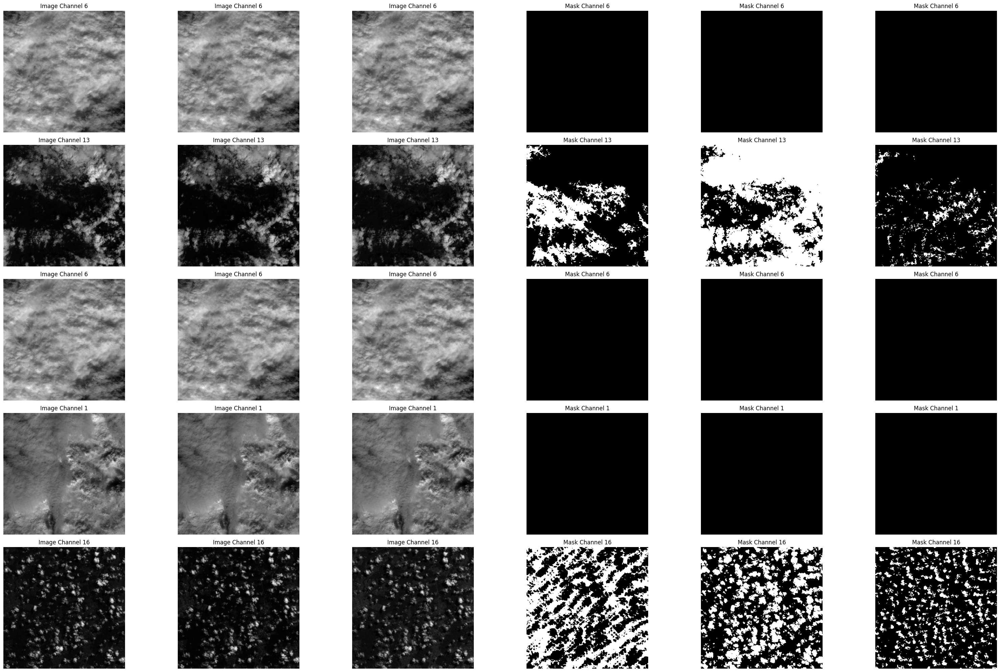

In [12]:
def visualize_images_and_masks(images, masks, num_samples=5):
    fig, axes = plt.subplots(num_samples, 6, figsize=(32, 20))
    for i in range(num_samples):
        randx = np.random.randint(32)
        for j in range(3):
            axes[i, j].imshow(images[randx, :, :, j], cmap='gray')
            axes[i, j].set_title(f'Image Channel {randx}')
            axes[i, j].axis('off')

            axes[i, j+3].imshow(masks[randx, :, :, j], cmap='gray')
            axes[i, j+3].set_title(f'Mask Channel {randx}')
            axes[i, j+3].axis('off')

    plt.tight_layout()
    plt.show()

for image_batch, mask_batch in train_dataset.take(1):
    visualize_images_and_masks(image_batch.numpy(), mask_batch.numpy())

## U-Net Building blocks
Create the building blocks for making the components U-Net model.

In [20]:
def double_conv_block(x, n_filters):
    x = layers.Conv2D(n_filters, 3, padding = "same", activation = "relu", kernel_initializer = "he_normal")(x)
    x = layers.Conv2D(n_filters, 3, padding = "same", activation = "relu", kernel_initializer = "he_normal")(x)
    return x

In [21]:
def downsample_block(x, n_filters):
    f = double_conv_block(x, n_filters)
    p = layers.MaxPool2D(2)(f)
    p = layers.Dropout(0.3)(p)
    return f, p

In [22]:
def upsample_block(x, conv_features, n_filters):
    x = layers.Conv2DTranspose(n_filters, 3, 2, padding="same")(x)
    x = layers.concatenate([x, conv_features])
    x = layers.Dropout(0.3)(x)
    x = double_conv_block(x, n_filters)
    return x

## Build the U-Net Model

In [23]:
def build_unet_model():
    inputs = layers.Input(shape=(256,256,3))

    # encoder: contracting path - downsample
    f1, p1 = downsample_block(inputs, 64)
    f2, p2 = downsample_block(p1, 128)
    f3, p3 = downsample_block(p2, 256)
    f4, p4 = downsample_block(p3, 512)

    # bottleneck
    bottleneck = double_conv_block(p4, 1024)

    # decoder: expanding path - upsample
    u6 = upsample_block(bottleneck, f4, 512)
    u7 = upsample_block(u6, f3, 256)
    u8 = upsample_block(u7, f2, 128)
    u9 = upsample_block(u8, f1, 64)

    # outputs
    outputs = layers.Conv2D(3, 1, padding="same", activation = "softmax")(u9)

    # unet model with Keras Functional API
    unet_model = tf.keras.Model(inputs, outputs, name="U-Net")

    return unet_model

In [24]:
unet_model = build_unet_model()

In [51]:
unet_model.summary()

Model: "U-Net"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2       │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_38 (Conv2D)  │ (None, 256, 256,  │      1,792 │ input_layer_2[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_39 (Conv2D)  │ (None, 256, 256,  │     36,928 │ conv2d_38[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_8     │ (None, 128, 128,  │          0 │ conv2d_39[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_16          │ (None, 128, 128,  │          0 │ max_pooling2d_8[… │
│ (Dropout)           │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_40 (Conv2D)  │ (None, 128, 128,  │     73,856 │ dropout_16[0][0]  │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_41 (Conv2D)  │ (None, 128, 128,  │    147,584 │ conv2d_40[0][0]   │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_9     │ (None, 64, 64,    │          0 │ conv2d_41[0][0]   │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_17          │ (None, 64, 64,    │          0 │ max_pooling2d_9[… │
│ (Dropout)           │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_42 (Conv2D)  │ (None, 64, 64,    │    295,168 │ dropout_17[0][0]  │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_43 (Conv2D)  │ (None, 64, 64,    │    590,080 │ conv2d_42[0][0]   │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_10    │ (None, 32, 32,    │          0 │ conv2d_43[0][0]   │
│ (MaxPooling2D)      │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_18          │ (None, 32, 32,    │          0 │ max_pooling2d_10… │
│ (Dropout)           │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_44 (Conv2D)  │ (None, 32, 32,    │  1,180,160 │ dropout_18[0][0]  │
│                     │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_45 (Conv2D)  │ (None, 32, 32,    │  2,359,808 │ conv2d_44[0][0]   │
│                     │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_11    │ (None, 16, 16,    │          0 │ conv2d_45[0][0]   │
│ (MaxPooling2D)      │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_19          │ (None, 16, 16,    │          0 │ max_pooling2d_11

 Total params: 34,513,475 (131.66 MB)

 Trainable params: 34,513,475 (131.66 MB)

 Non-trainable params: 0 (0.00 B)

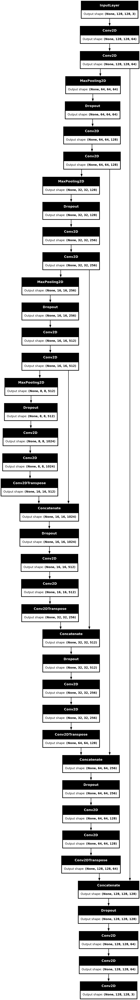

In [25]:
tf.keras.utils.plot_model(unet_model, show_shapes=True)

## Compile and Train U-Net

In [25]:
unet_model.compile(optimizer=tf.keras.optimizers.Adam(),
                   loss="categorical_crossentropy",
                   metrics=["accuracy"])

In [26]:
NUM_EPOCHS = 200

TRAIN_LENGTH = info.splits["train"].num_examples
STEPS_PER_EPOCH = TRAIN_LENGTH // BATCH_SIZE

VAL_SUBSPLITS = 5
TEST_LENGTH = info.splits["val"].num_examples
VALIDATION_STEPS = TEST_LENGTH // BATCH_SIZE // VAL_SUBSPLITS

In [28]:
checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath='unet.weights.h5',
    save_weights_only=True,
    monitor='val_loss',
    mode='min',
    save_best_only=True,
    verbose=1
)

callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=5, min_delta=0.01, restore_best_weights=True)

In [29]:
model_history = unet_model.fit(train_dataset,
                               epochs=NUM_EPOCHS,
                               batch_size=4,
                               validation_data=val_dataset,
                               callbacks=[callback])

Epoch 1/200


2024-06-02 21:21:49.708099: E external/local_xla/xla/service/slow_operation_alarm.cc:65] Trying algorithm eng0{} for conv (f32[64,64,3,3]{3,2,1,0}, u8[0]{0}) custom-call(f32[32,64,256,256]{3,2,1,0}, f32[32,64,256,256]{3,2,1,0}), window={size=3x3 pad=1_1x1_1}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBackwardFilter", backend_config={"conv_result_scale":1,"activation_mode":"kNone","side_input_scale":0,"leakyrelu_alpha":0} is taking a while...

2024-06-02 21:21:52.579502: E external/local_xla/xla/service/slow_operation_alarm.cc:133] The operation took 3.871519873s

Trying algorithm eng0{} for conv (f32[64,64,3,3]{3,2,1,0}, u8[0]{0}) custom-call(f32[32,64,256,256]{3,2,1,0}, f32[32,64,256,256]{3,2,1,0}), window={size=3x3 pad=1_1x1_1}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBackwardFilter", backend_config={"conv_result_scale":1,"activation_mode":"kNone","side_input_scale":0,"leakyrelu_alpha":0} is taking a while...

2024-06-02 21:21:56.728992: E extern

12/13 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - accuracy: 0.4064 - loss: 1.2901

2024-06-02 21:26:49.616785: E external/local_xla/xla/service/slow_operation_alarm.cc:65] Trying algorithm eng0{} for conv (f32[64,64,3,3]{3,2,1,0}, u8[0]{0}) custom-call(f32[26,64,256,256]{3,2,1,0}, f32[26,64,256,256]{3,2,1,0}), window={size=3x3 pad=1_1x1_1}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBackwardFilter", backend_config={"conv_result_scale":1,"activation_mode":"kNone","side_input_scale":0,"leakyrelu_alpha":0} is taking a while...

2024-06-02 21:26:51.820444: E external/local_xla/xla/service/slow_operation_alarm.cc:133] The operation took 3.203798265s

Trying algorithm eng0{} for conv (f32[64,64,3,3]{3,2,1,0}, u8[0]{0}) custom-call(f32[26,64,256,256]{3,2,1,0}, f32[26,64,256,256]{3,2,1,0}), window={size=3x3 pad=1_1x1_1}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBackwardFilter", backend_config={"conv_result_scale":1,"activation_mode":"kNone","side_input_scale":0,"leakyrelu_alpha":0} is taking a while...

2024-06-02 21:26:55.415611: E extern

13/13 ━━━━━━━━━━━━━━━━━━━━ 626s 26s/step - accuracy: 0.4172 - loss: 1.2554 - val_accuracy: 0.6766 - val_loss: 0.8216

Epoch 2/200

13/13 ━━━━━━━━━━━━━━━━━━━━ 20s 2s/step - accuracy: 0.5729 - loss: 0.7714 - val_accuracy: 0.4812 - val_loss: 0.7588

Epoch 3/200

13/13 ━━━━━━━━━━━━━━━━━━━━ 20s 2s/step - accuracy: 0.5901 - loss: 0.7367 - val_accuracy: 0.7094 - val_loss: 0.7113

Epoch 4/200

13/13 ━━━━━━━━━━━━━━━━━━━━ 20s 2s/step - accuracy: 0.7116 - loss: 0.7013 - val_accuracy: 0.7354 - val_loss: 0.6687

Epoch 5/200

13/13 ━━━━━━━━━━━━━━━━━━━━ 20s 2s/step - accuracy: 0.7510 - loss: 0.6331 - val_accuracy: 0.7711 - val_loss: 0.6082

Epoch 6/200

13/13 ━━━━━━━━━━━━━━━━━━━━ 20s 2s/step - accuracy: 0.7756 - loss: 0.6021 - val_accuracy: 0.7917 - val_loss: 0.5670

Epoch 7/200

13/13 ━━━━━━━━━━━━━━━━━━━━ 20s 2s/step - accuracy: 0.8140 - loss: 0.5180 - val_accuracy: 0.7914 - val_loss: 0.5518

Epoch 8/200

13/13 ━━━━━━━━━━━━━━━━━━━━ 20s 2s/step - accuracy: 0.7944 - loss: 0.5587 - val_accuracy: 0.8138

In [32]:
unet_model.save('unet_model.weights.h5')

## **Learning curve from model history**

In [22]:
def display_learning_curves(history, metric, Loss, third=None):
    acc = history.history[f"{metric}"]
    val_acc = history.history[f"val_{metric}"]

    loss = history.history[f"{Loss}"]
    val_loss = history.history[f"val_{Loss}"]

    fig = plt.figure(figsize=(12,6))

    plt.subplot(1,3,1)
    plt.plot(range(0, len(acc)), acc, label=f"train {metric}")
    plt.plot(range(0, len(val_acc)), val_acc, label=f"validataion {metric}")
    plt.title(f"{metric}")
    plt.xlabel("Epoch")
    plt.ylabel(f"{metric}")
    plt.legend(loc="lower right")

    plt.subplot(1,3,2)
    plt.plot(range(0, len(loss)), loss, label=f"train {Loss}")
    plt.plot(range(0, len(val_loss)), val_loss, label=f"validataion {Loss}")
    plt.title(f"{Loss}")
    plt.xlabel("Epoch")
    plt.ylabel(Loss)
    plt.legend(loc="upper right")
    
    if third:
        third_metric = history.history[f"{third}"]
        val_third_metric = history.history[f"val_{third}"]
        
        plt.subplot(1,3,3)
        plt.plot(range(0, len(third_metric)), third_metric, label=f"train {third}")
        plt.plot(range(0, len(val_third_metric)), val_third_metric, label=f"validataion {third}")
        plt.title(f"{third}")
        plt.xlabel("Epoch")
        plt.ylabel(third)
        plt.legend(loc="upper right")

    fig.tight_layout()
    plt.show()

In [40]:
display_learning_curves(unet_model.history)

NameError: name 'unet_model' is not defined

## **Predictions with U-Net model**
Let's try the trained U-Net model on a few samples from the test dataset.

In [192]:
subscenes = '/kaggle/input/sentinel2-cloud-mask-catalogue/subscenes/subscenes/S2A_MSIL1C_20180101T074231_N0206_R049_T37LDJ_20180101T111527.npy'
npy = np.load(subscenes)
img = cv2.resize(npy[..., [2, 3, 4]], (256, 256), interpolation = cv2.INTER_NEAREST)
img = np.expand_dims(img, axis=0)

In [193]:
predictions = unet_model.predict(img)
print(predictions.shape)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step

(1, 256, 256, 3)


In [21]:
def Display(original_image, predictions):
    class_names = {0: 'CLEAR', 1: 'CLOUD', 2: 'CLOUD_SHADOW'}
    fig, axes = plt.subplots(1, predictions.shape[-1] + 1, figsize=(15, 5))
    axes[0].imshow(original_image)
    axes[0].set_title('Original Image')
    axes[0].axis('off')

    for i in range(predictions.shape[-1]):
        binary_mask = np.where(predictions[:, :, i] > 0.5, 1, 0)
        axes[i+1].imshow(binary_mask, cmap='gray')
        axes[i+1].set_title(f'{class_names[i]}')
        axes[i+1].axis('off')

    plt.tight_layout()
    plt.show()

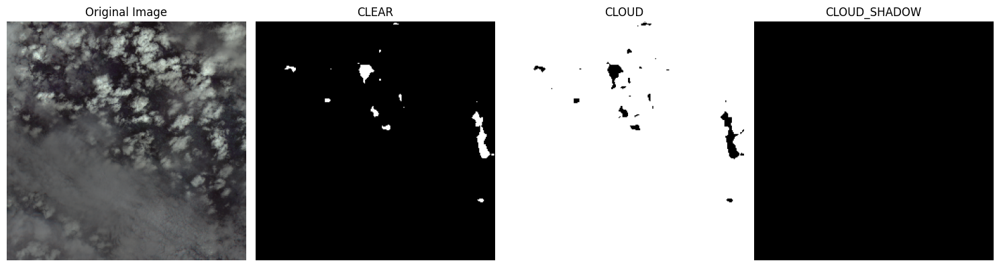

In [195]:
Display(img.squeeze(), predictions.squeeze())

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


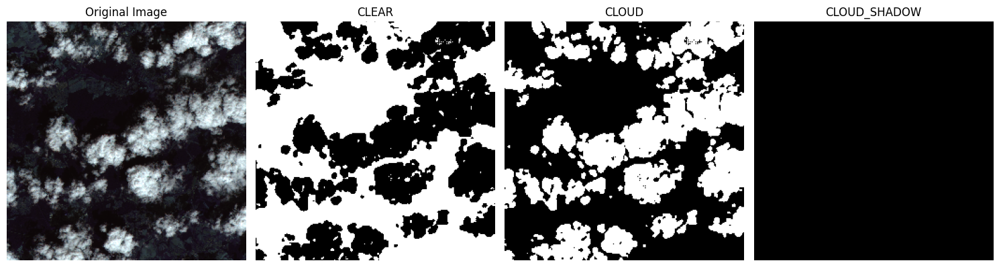

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


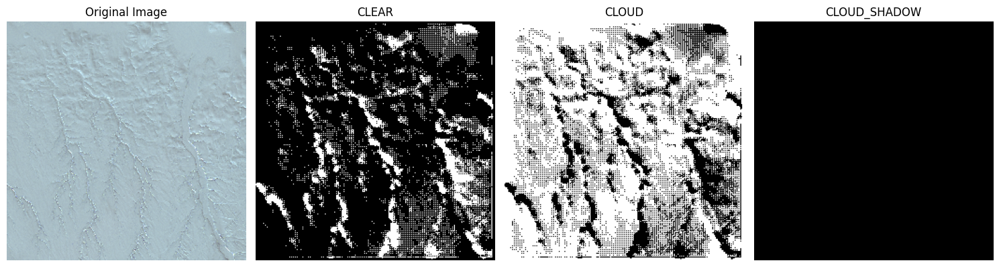

In [190]:
for image_batch, mask_batch in train_dataset.take(2):
    image_batch = image_batch.numpy()
    image = np.expand_dims(image_batch[0], axis=0)
    predictions = unet_model.predict(image)
    Display(image[0].squeeze(), predictions.squeeze())

In [191]:
unet_model.save('unet_trained.h5')

## **Train U-Net**

In [26]:
def unet_model(input_shape, num_classes):
    inputs = tf.keras.Input(shape=input_shape)
    
    # Encoder
    conv1 = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', padding='same')(inputs)
    conv1 = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', padding='same')(conv1)
    pool1 = tf.keras.layers.MaxPooling2D((2, 2))(conv1)
    
    conv2 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', padding='same')(pool1)
    conv2 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', padding='same')(conv2)
    pool2 = tf.keras.layers.MaxPooling2D((2, 2))(conv2)
    
    conv3 = tf.keras.layers.Conv2D(128, (3, 3), activation='relu', padding='same')(pool2)
    conv3 = tf.keras.layers.Conv2D(128, (3, 3), activation='relu', padding='same')(conv3)
    pool3 = tf.keras.layers.MaxPooling2D((2, 2))(conv3)
    
    # Bottleneck
    conv4 = tf.keras.layers.Conv2D(256, (3, 3), activation='relu', padding='same')(pool3)
    conv4 = tf.keras.layers.Conv2D(256, (3, 3), activation='relu', padding='same')(conv4)
    
    # Decoder
    up1 = tf.keras.layers.UpSampling2D((2, 2))(conv4)
    up1 = tf.keras.layers.Conv2D(128, (3, 3), activation='relu', padding='same')(up1)
    
    merge1 = tf.keras.layers.Concatenate()([conv3, up1])
    conv5 = tf.keras.layers.Conv2D(128, (3, 3), activation='relu', padding='same')(merge1)
    conv5 = tf.keras.layers.Conv2D(128, (3, 3), activation='relu', padding='same')(conv5)
    
    up2 = tf.keras.layers.UpSampling2D((2, 2))(conv5)
    up2 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', padding='same')(up2)
    
    merge2 = tf.keras.layers.Concatenate()([conv2, up2])
    conv6 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', padding='same')(merge2)
    conv6 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', padding='same')(conv6)
    
    up3 = tf.keras.layers.UpSampling2D((2, 2))(conv6)
    up3 = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', padding='same')(up3)
    
    merge3 = tf.keras.layers.Concatenate()([conv1, up3])
    conv7 = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', padding='same')(merge3)
    conv7 = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', padding='same')(conv7)
    
    outputs = tf.keras.layers.Conv2D(num_classes, (1, 1), activation='softmax')(conv7)
    
    model = tf.keras.Model(inputs=inputs, outputs=outputs)
    
    return model

In [17]:
def iou_metric(y_true, y_pred):
    y_true = tf.argmax(y_true, axis=-1)
    y_pred = tf.argmax(y_pred, axis=-1)
    
    intersection = tf.reduce_sum(tf.cast(y_true * y_pred, tf.float32))
    union = tf.reduce_sum(tf.cast(y_true + y_pred - y_true * y_pred, tf.float32))
    
    iou = intersection / (union + tf.keras.backend.epsilon())
    return iou

def cce_jaccard_loss(y_true, y_pred):
    cce = tf.keras.losses.categorical_crossentropy(y_true, y_pred)
    y_true_f = tf.keras.backend.flatten(y_true)
    y_pred_f = tf.keras.backend.flatten(y_pred)
    
    intersection = tf.reduce_sum(y_true_f * y_pred_f)
    union = tf.reduce_sum(y_true_f + y_pred_f - y_true_f * y_pred_f)
    
    jaccard = intersection / (union + tf.keras.backend.epsilon())
    jaccard_loss = 1 - jaccard
    
    return cce + jaccard_loss

In [28]:
input_shape = (256, 256, 3)
num_classes = 3

model = unet_model(input_shape, num_classes)
model.compile(optimizer='adam', loss=cce_jaccard_loss, metrics=['accuracy', iou_metric])
model.summary()

Model: "functional_5"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2       │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_52 (Conv2D)  │ (None, 256, 256,  │        896 │ input_layer_2[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_53 (Conv2D)  │ (None, 256, 256,  │      9,248 │ conv2d_52[0][0]   │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_10    │ (None, 128, 128,  │          0 │ conv2d_53[0][0]   │
│ (MaxPooling2D)      │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_54 (Conv2D)  │ (None, 128, 128,  │     18,496 │ max_pooling2d_10… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_55 (Conv2D)  │ (None, 128, 128,  │     36,928 │ conv2d_54[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_11    │ (None, 64, 64,    │          0 │ conv2d_55[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_56 (Conv2D)  │ (None, 64, 64,    │     73,856 │ max_pooling2d_11… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_57 (Conv2D)  │ (None, 64, 64,    │    147,584 │ conv2d_56[0][0]   │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_12    │ (None, 32, 32,    │          0 │ conv2d_57[0][0]   │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_58 (Conv2D)  │ (None, 32, 32,    │    295,168 │ max_pooling2d_12… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_59 (Conv2D)  │ (None, 32, 32,    │    590,080 │ conv2d_58[0][0]   │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ up_sampling2d_10    │ (None, 64, 64,    │          0 │ conv2d_59[0][0]   │
│ (UpSampling2D)      │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_60 (Conv2D)  │ (None, 64, 64,    │    295,040 │ up_sampling2d_10… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate         │ (None, 64, 64,    │          0 │ conv2d_57[0][0],  │
│ (Concatenate)       │ 256)              │            │ conv2d_60[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_61 (Conv2D)  │ (None, 64, 64,    │    295,040 │ concatenate[0][0] │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_62 (Conv2D)  │ (None, 64, 64,    │    147,584 │ conv2d_61[0][0] 

 Total params: 2,140,707 (8.17 MB)

 Trainable params: 2,140,707 (8.17 MB)

 Non-trainable params: 0 (0.00 B)

In [29]:
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'

In [30]:
callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

with tf.device('/GPU:0'):
    model.fit(train_dataset,
             batch_size=1,
             epochs=100,
             validation_data=val_dataset,
             callbacks=[callback])

Epoch 1/100

13/13 ━━━━━━━━━━━━━━━━━━━━ 87s 4s/step - accuracy: 0.3992 - iou_metric: 0.4924 - loss: 1.7007 - val_accuracy: 0.5097 - val_iou_metric: 0.5507 - val_loss: 1.3884

Epoch 2/100

13/13 ━━━━━━━━━━━━━━━━━━━━ 7s 557ms/step - accuracy: 0.5657 - iou_metric: 0.5280 - loss: 1.3405 - val_accuracy: 0.7039 - val_iou_metric: 0.5943 - val_loss: 1.3133

Epoch 3/100

13/13 ━━━━━━━━━━━━━━━━━━━━ 7s 558ms/step - accuracy: 0.6996 - iou_metric: 0.5917 - loss: 1.2857 - val_accuracy: 0.6998 - val_iou_metric: 0.5618 - val_loss: 1.2774

Epoch 4/100

13/13 ━━━━━━━━━━━━━━━━━━━━ 7s 555ms/step - accuracy: 0.6824 - iou_metric: 0.5292 - loss: 1.2594 - val_accuracy: 0.7123 - val_iou_metric: 0.6006 - val_loss: 1.2307

Epoch 5/100

13/13 ━━━━━━━━━━━━━━━━━━━━ 7s 556ms/step - accuracy: 0.7549 - iou_metric: 0.6393 - loss: 1.1462 - val_accuracy: 0.7263 - val_iou_metric: 0.5969 - val_loss: 1.1582

Epoch 6/100

13/13 ━━━━━━━━━━━━━━━━━━━━ 7s 555ms/step - accuracy: 0.7602 - iou_metric: 0.6288 - loss: 1.0999 - val_ac

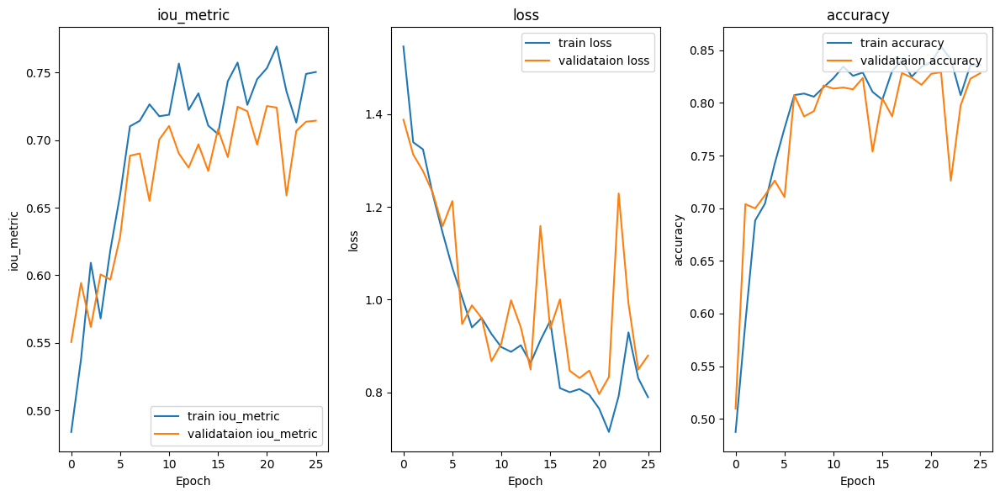

In [31]:
display_learning_curves(model.history, 'iou_metric', 'loss', 'accuracy')

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


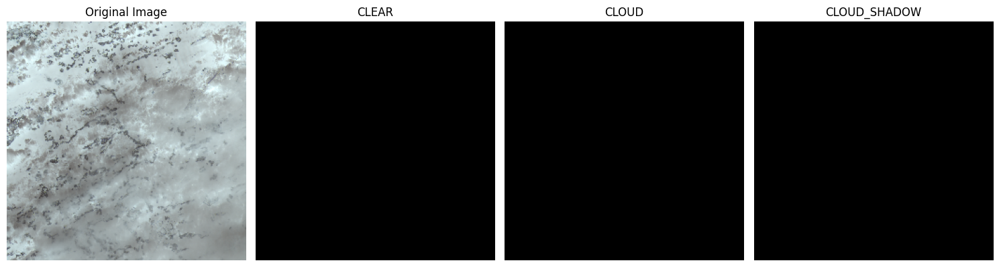

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


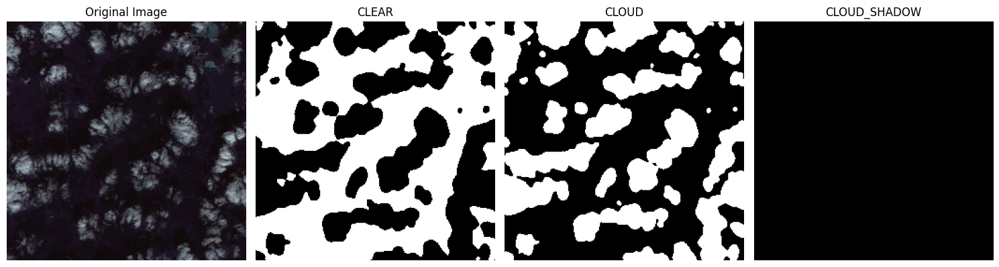

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


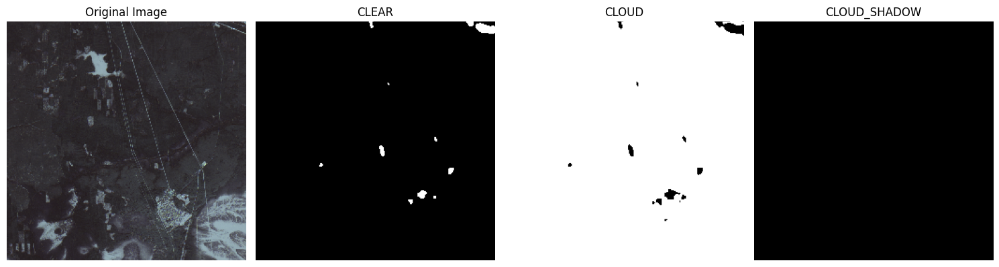

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


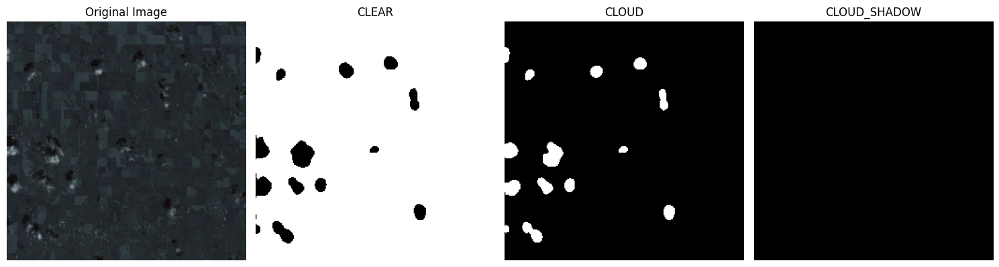

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


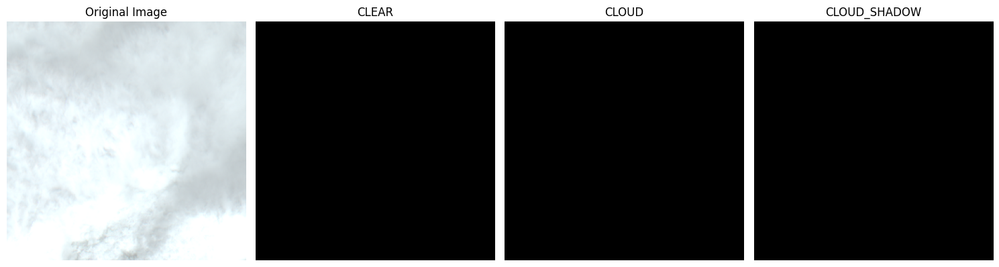

In [50]:
for image_batch, mask_batch in val_dataset.take(1):
    image_batch = image_batch.numpy()
    
    for i in range(5):
        randx = np.random.randint(1, 32)
        image = np.expand_dims(image_batch[randx], axis=0)
        predictions = model.predict(image)
        Display(image.squeeze(), predictions.squeeze())

## **Train FCN**

In [12]:
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Conv2D, Conv2DTranspose, Activation, Add

def FCN(input_shape, num_classes):
    inputs = Input(shape=input_shape)
    
    # Encoder
    conv1 = Conv2D(64, (3, 3), activation='relu', padding='same')(inputs)
    conv2 = Conv2D(64, (3, 3), activation='relu', padding='same')(conv1)
    pool1 = Conv2D(64, (3, 3), strides=(2, 2), padding='same')(conv2)
    
    conv3 = Conv2D(128, (3, 3), activation='relu', padding='same')(pool1)
    conv4 = Conv2D(128, (3, 3), activation='relu', padding='same')(conv3)
    pool2 = Conv2D(128, (3, 3), strides=(2, 2), padding='same')(conv4)
    
    conv5 = Conv2D(256, (3, 3), activation='relu', padding='same')(pool2)
    conv6 = Conv2D(256, (3, 3), activation='relu', padding='same')(conv5)
    pool3 = Conv2D(256, (3, 3), strides=(2, 2), padding='same')(conv6)
    
    # Decoder
    conv7 = Conv2D(512, (3, 3), activation='relu', padding='same')(pool3)
    conv8 = Conv2D(512, (3, 3), activation='relu', padding='same')(conv7)
    up1 = Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(conv8)
    skip1 = Add()([up1, conv6])
    
    conv9 = Conv2D(256, (3, 3), activation='relu', padding='same')(skip1)
    conv10 = Conv2D(256, (3, 3), activation='relu', padding='same')(conv9)
    up2 = Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(conv10)
    skip2 = Add()([up2, conv4])
    
    conv11 = Conv2D(128, (3, 3), activation='relu', padding='same')(skip2)
    conv12 = Conv2D(128, (3, 3), activation='relu', padding='same')(conv11)
    up3 = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(conv12)
    skip3 = Add()([up3, conv2])
    
    conv13 = Conv2D(64, (3, 3), activation='relu', padding='same')(skip3)
    conv14 = Conv2D(64, (3, 3), activation='relu', padding='same')(conv13)
    
    # Output layer
    outputs = Conv2D(num_classes, (1, 1), activation='softmax')(conv14)
    
    model = Model(inputs, outputs)
    return model

In [13]:
input_shape = (256, 256, 3)
num_classes = 3
fcn_model = FCN(input_shape, num_classes)
fcn_model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 256, 256,  │      1,792 │ input_layer[0][0] │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 256, 256,  │     36,928 │ conv2d[0][0]      │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 128, 128,  │     36,928 │ conv2d_1[0][0]    │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 128, 128,  │     73,856 │ conv2d_2[0][0]    │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 128, 128,  │    147,584 │ conv2d_3[0][0]    │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_5 (Conv2D)   │ (None, 64, 64,    │    147,584 │ conv2d_4[0][0]    │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_6 (Conv2D)   │ (None, 64, 64,    │    295,168 │ conv2d_5[0][0]    │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_7 (Conv2D)   │ (None, 64, 64,    │    590,080 │ conv2d_6[0][0]    │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_8 (Conv2D)   │ (None, 32, 32,    │    590,080 │ conv2d_7[0][0]    │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_9 (Conv2D)   │ (None, 32, 32,    │  1,180,160 │ conv2d_8[0][0]    │
│                     │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_10 (Conv2D)  │ (None, 32, 32,    │  2,359,808 │ conv2d_9[0][0]    │
│                     │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_transpose    │ (None, 64, 64,    │    524,544 │ conv2d_10[0][0]   │
│ (Conv2DTranspose)   │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add (Add)           │ (None, 64, 64,    │          0 │ conv2d_transpose… │
│                     │ 256)              │            │ conv2d_7[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_11 (Conv2D)  │ (None, 64, 64,    │    590,080 │ add[0][0]         │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_12 (Conv2D)  │ (None, 64, 64,    │    590,080 │ conv2d_11[0][0]   │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_transpose_1  │ (None, 128, 128,  │    131,200 │ conv2d_12[0][0] 

 Total params: 7,697,923 (29.37 MB)

 Trainable params: 7,697,923 (29.37 MB)

 Non-trainable params: 0 (0.00 B)

In [16]:
tf.keras.utils.plot_model(fcn_model, show_shapes=True)

<Figure size 640x480 with 0 Axes>

In [18]:
fcn_model.compile(optimizer='adam', loss=cce_jaccard_loss, metrics=['accuracy', iou_metric])
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'

In [19]:
callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

with tf.device('/GPU:0'):
    fcn_model.fit(train_dataset,
                batch_size=1,
                epochs=100,
                validation_data=val_dataset,
                callbacks=[callback])

Epoch 1/100


2024-06-06 06:50:48.288737: E external/local_xla/xla/service/slow_operation_alarm.cc:65] Trying algorithm eng0{} for conv (f32[64,64,3,3]{3,2,1,0}, u8[0]{0}) custom-call(f32[32,64,256,256]{3,2,1,0}, f32[32,64,256,256]{3,2,1,0}), window={size=3x3 pad=1_1x1_1}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBackwardFilter", backend_config={"conv_result_scale":1,"activation_mode":"kNone","side_input_scale":0,"leakyrelu_alpha":0} is taking a while...
2024-06-06 06:50:52.147793: E external/local_xla/xla/service/slow_operation_alarm.cc:133] The operation took 4.85923236s
Trying algorithm eng0{} for conv (f32[64,64,3,3]{3,2,1,0}, u8[0]{0}) custom-call(f32[32,64,256,256]{3,2,1,0}, f32[32,64,256,256]{3,2,1,0}), window={size=3x3 pad=1_1x1_1}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBackwardFilter", backend_config={"conv_result_scale":1,"activation_mode":"kNone","side_input_scale":0,"leakyrelu_alpha":0} is taking a while...
2024-06-06 06:50:56.569254: E external/l

12/13 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - accuracy: 0.3842 - iou_metric: 0.5186 - loss: 2.3123

2024-06-06 06:53:27.833416: E external/local_xla/xla/service/slow_operation_alarm.cc:65] Trying algorithm eng0{} for conv (f32[64,64,3,3]{3,2,1,0}, u8[0]{0}) custom-call(f32[26,64,256,256]{3,2,1,0}, f32[26,64,256,256]{3,2,1,0}), window={size=3x3 pad=1_1x1_1}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBackwardFilter", backend_config={"conv_result_scale":1,"activation_mode":"kNone","side_input_scale":0,"leakyrelu_alpha":0} is taking a while...
2024-06-06 06:53:30.627394: E external/local_xla/xla/service/slow_operation_alarm.cc:133] The operation took 3.794093734s
Trying algorithm eng0{} for conv (f32[64,64,3,3]{3,2,1,0}, u8[0]{0}) custom-call(f32[26,64,256,256]{3,2,1,0}, f32[26,64,256,256]{3,2,1,0}), window={size=3x3 pad=1_1x1_1}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBackwardFilter", backend_config={"conv_result_scale":1,"activation_mode":"kNone","side_input_scale":0,"leakyrelu_alpha":0} is taking a while...
2024-06-06 06:53:34.322500: E external/

13/13 ━━━━━━━━━━━━━━━━━━━━ 349s 14s/step - accuracy: 0.3932 - iou_metric: 0.4823 - loss: 2.2857 - val_accuracy: 0.4737 - val_iou_metric: 0.0000e+00 - val_loss: 1.6685
Epoch 2/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 14s 1s/step - accuracy: 0.4662 - iou_metric: 9.2977e-09 - loss: 1.6200 - val_accuracy: 0.5183 - val_iou_metric: 0.1221 - val_loss: 1.4504
Epoch 3/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 14s 1s/step - accuracy: 0.6453 - iou_metric: 0.4494 - loss: 1.3926 - val_accuracy: 0.6928 - val_iou_metric: 0.6091 - val_loss: 1.3033
Epoch 4/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 14s 1s/step - accuracy: 0.7193 - iou_metric: 0.6028 - loss: 1.2434 - val_accuracy: 0.7156 - val_iou_metric: 0.6027 - val_loss: 1.2088
Epoch 5/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 14s 1s/step - accuracy: 0.7514 - iou_metric: 0.6383 - loss: 1.1194 - val_accuracy: 0.7651 - val_iou_metric: 0.6127 - val_loss: 1.1301
Epoch 6/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 14s 1s/step - accuracy: 0.8010 - iou_metric: 0.6874 - loss: 1.0291 - val_accuracy: 0.7433 - val_io

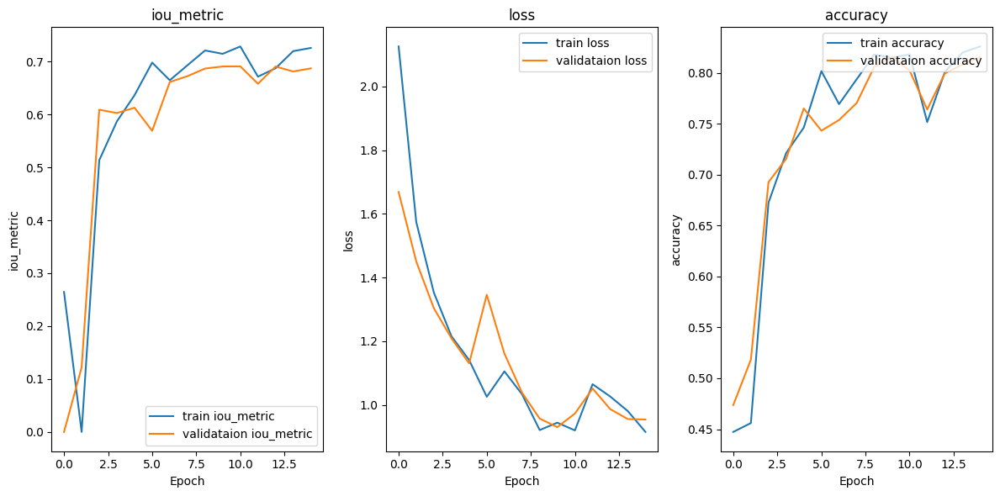

In [24]:
display_learning_curves(fcn_model.history, 'iou_metric', 'loss', 'accuracy')

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


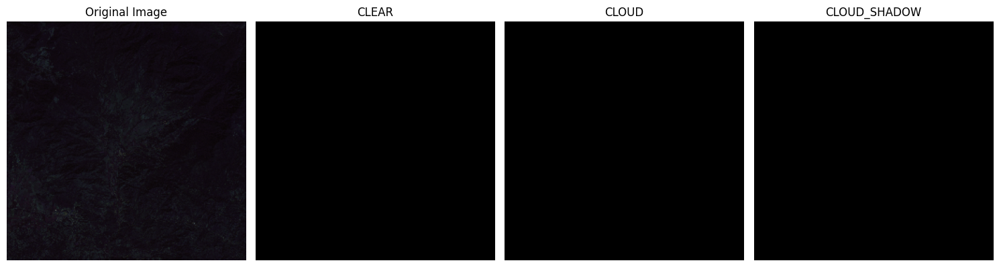

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


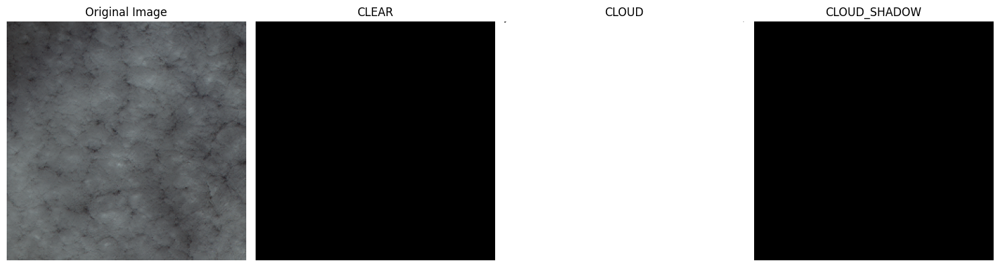

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


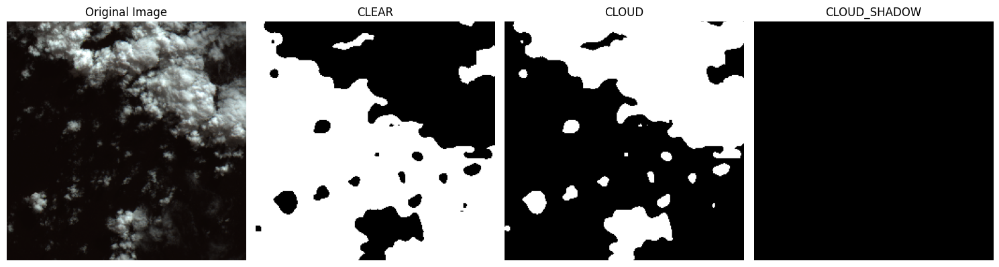

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


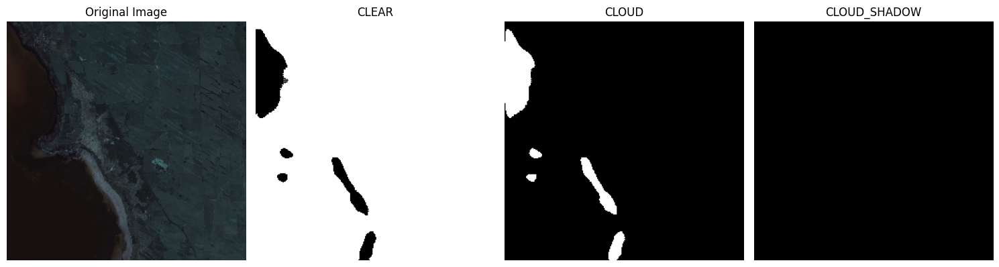

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


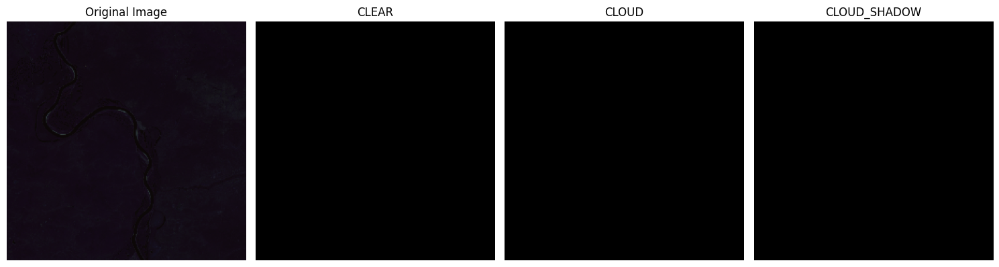

In [29]:
for image_batch, mask_batch in train_dataset.take(1):
    image_batch = image_batch.numpy()
    
    for i in range(5):
        randx = np.random.randint(1, 32)
        image = np.expand_dims(image_batch[randx], axis=0)
        predictions = fcn_model.predict(image)
        Display(image.squeeze(), predictions.squeeze())

## **Train SegNet Model**

In [35]:
def segnet_model(input_shape, num_classes):
    inputs = tf.keras.Input(shape=input_shape)

    # Encoder
    conv1 = tf.keras.layers.Conv2D(64, (3, 3), padding='same', activation='relu')(inputs)
    conv1 = tf.keras.layers.Conv2D(64, (3, 3), padding='same', activation='relu')(conv1)
    pool1 = tf.keras.layers.MaxPooling2D((2, 2))(conv1)

    conv2 = tf.keras.layers.Conv2D(128, (3, 3), padding='same', activation='relu')(pool1)
    conv2 = tf.keras.layers.Conv2D(128, (3, 3), padding='same', activation='relu')(conv2)
    pool2 = tf.keras.layers.MaxPooling2D((2, 2))(conv2)

    conv3 = tf.keras.layers.Conv2D(256, (3, 3), padding='same', activation='relu')(pool2)
    conv3 = tf.keras.layers.Conv2D(256, (3, 3), padding='same', activation='relu')(conv3)
    conv3 = tf.keras.layers.Conv2D(256, (3, 3), padding='same', activation='relu')(conv3)
    pool3 = tf.keras.layers.MaxPooling2D((2, 2))(conv3)

    conv4 = tf.keras.layers.Conv2D(512, (3, 3), padding='same', activation='relu')(pool3)
    conv4 = tf.keras.layers.Conv2D(512, (3, 3), padding='same', activation='relu')(conv4)
    conv4 = tf.keras.layers.Conv2D(512, (3, 3), padding='same', activation='relu')(conv4)
    pool4 = tf.keras.layers.MaxPooling2D((2, 2))(conv4)

    conv5 = tf.keras.layers.Conv2D(512, (3, 3), padding='same', activation='relu')(pool4)
    conv5 = tf.keras.layers.Conv2D(512, (3, 3), padding='same', activation='relu')(conv5)
    conv5 = tf.keras.layers.Conv2D(512, (3, 3), padding='same', activation='relu')(conv5)
    pool5 = tf.keras.layers.MaxPooling2D((2, 2))(conv5)

    # Decoder
    up6 = tf.keras.layers.UpSampling2D((2, 2))(pool5)
    conv6 = tf.keras.layers.Conv2D(512, (3, 3), padding='same', activation='relu')(up6)
    conv6 = tf.keras.layers.Conv2D(512, (3, 3), padding='same', activation='relu')(conv6)
    conv6 = tf.keras.layers.Conv2D(512, (3, 3), padding='same', activation='relu')(conv6)

    up7 = tf.keras.layers.UpSampling2D((2, 2))(conv6)
    conv7 = tf.keras.layers.Conv2D(512, (3, 3), padding='same', activation='relu')(up7)
    conv7 = tf.keras.layers.Conv2D(512, (3, 3), padding='same', activation='relu')(conv7)
    conv7 = tf.keras.layers.Conv2D(256, (3, 3), padding='same', activation='relu')(conv7)

    up8 = tf.keras.layers.UpSampling2D((2, 2))(conv7)
    conv8 = tf.keras.layers.Conv2D(256, (3, 3), padding='same', activation='relu')(up8)
    conv8 = tf.keras.layers.Conv2D(256, (3, 3), padding='same', activation='relu')(conv8)
    conv8 = tf.keras.layers.Conv2D(128, (3, 3), padding='same', activation='relu')(conv8)

    up9 = tf.keras.layers.UpSampling2D((2, 2))(conv8)
    conv9 = tf.keras.layers.Conv2D(128, (3, 3), padding='same', activation='relu')(up9)
    conv9 = tf.keras.layers.Conv2D(64, (3, 3), padding='same', activation='relu')(conv9)

    up10 = tf.keras.layers.UpSampling2D((2, 2))(conv9)
    conv10 = tf.keras.layers.Conv2D(64, (3, 3), padding='same', activation='relu')(up10)
    conv10 = tf.keras.layers.Conv2D(num_classes, (1, 1), activation='softmax')(conv10)

    model = tf.keras.Model(inputs=inputs, outputs=conv10)
    return model

In [36]:
input_shape = (256, 256, 3)
num_classes = 3

segnet_model = segnet_model(input_shape, num_classes)
segnet_model.compile(optimizer='adam', loss=cce_jaccard_loss, metrics=['accuracy', iou_metric])
segnet_model.summary()

Model: "functional_7"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_3 (InputLayer)      │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_70 (Conv2D)              │ (None, 256, 256, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_71 (Conv2D)              │ (None, 256, 256, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_13 (MaxPooling2D) │ (None, 128, 128, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_72 (Conv2D)              │ (None, 128, 128, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_73 (Conv2D)              │ (None, 128, 128, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_14 (MaxPooling2D) │ (None, 64, 64, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_74 (Conv2D)              │ (None, 64, 64, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_75 (Conv2D)              │ (None, 64, 64, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_76 (Conv2D)              │ (None, 64, 64, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_15 (MaxPooling2D) │ (None, 32, 32, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_77 (Conv2D)              │ (None, 32, 32, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_78 (Conv2D)              │ (None, 32, 32, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_79 (Conv2D)              │ (None, 32, 32, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_16 (MaxPooling2D) │ (None, 16, 16, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_80 (Conv2D)              │ (None, 16, 16, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_81 (Conv2D)              │ (None, 16, 16, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_82 (Conv2D)              │ (None, 16, 16, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_17 (MaxPooling2D) │ (None, 8, 8, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d_13 (UpSampling2D) │ (None, 16, 16, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_83 (Conv2D)              │ (None, 16, 16, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_84 (Conv2D)              │ (None, 16, 16, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_85 (Conv2D)              │ (None, 16, 16, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d_14 (UpSampling2D) │ (None, 32, 32, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_86 (Conv2D)              │ (None, 32, 32, 512)    │     2,359,80

 Total params: 29,427,331 (112.26 MB)

 Trainable params: 29,427,331 (112.26 MB)

 Non-trainable params: 0 (0.00 B)

In [37]:
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'

callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

with tf.device('/GPU:0'):
    segnet_model.fit(train_dataset,
             batch_size=1,
             epochs=100,
             validation_data=val_dataset,
             callbacks=[callback])

Epoch 1/100

13/13 ━━━━━━━━━━━━━━━━━━━━ 27s 1s/step - accuracy: 0.4871 - iou_metric: 0.3019 - loss: 5.9447 - val_accuracy: 0.4737 - val_iou_metric: 0.0000e+00 - val_loss: 1.7015

Epoch 2/100

13/13 ━━━━━━━━━━━━━━━━━━━━ 12s 954ms/step - accuracy: 0.4767 - iou_metric: 0.1642 - loss: 1.5889 - val_accuracy: 0.5084 - val_iou_metric: 0.5454 - val_loss: 1.4484

Epoch 3/100

13/13 ━━━━━━━━━━━━━━━━━━━━ 12s 955ms/step - accuracy: 0.5227 - iou_metric: 0.5461 - loss: 1.4420 - val_accuracy: 0.5097 - val_iou_metric: 0.5506 - val_loss: 1.4606

Epoch 4/100

13/13 ━━━━━━━━━━━━━━━━━━━━ 12s 957ms/step - accuracy: 0.4776 - iou_metric: 0.4116 - loss: 1.4574 - val_accuracy: 0.5097 - val_iou_metric: 0.5506 - val_loss: 1.4529

Epoch 5/100

13/13 ━━━━━━━━━━━━━━━━━━━━ 12s 957ms/step - accuracy: 0.5289 - iou_metric: 0.5565 - loss: 1.4362 - val_accuracy: 0.5088 - val_iou_metric: 0.5468 - val_loss: 1.4471

Epoch 6/100

13/13 ━━━━━━━━━━━━━━━━━━━━ 12s 949ms/step - accuracy: 0.5204 - iou_metric: 0.5501 - loss: 1.4459

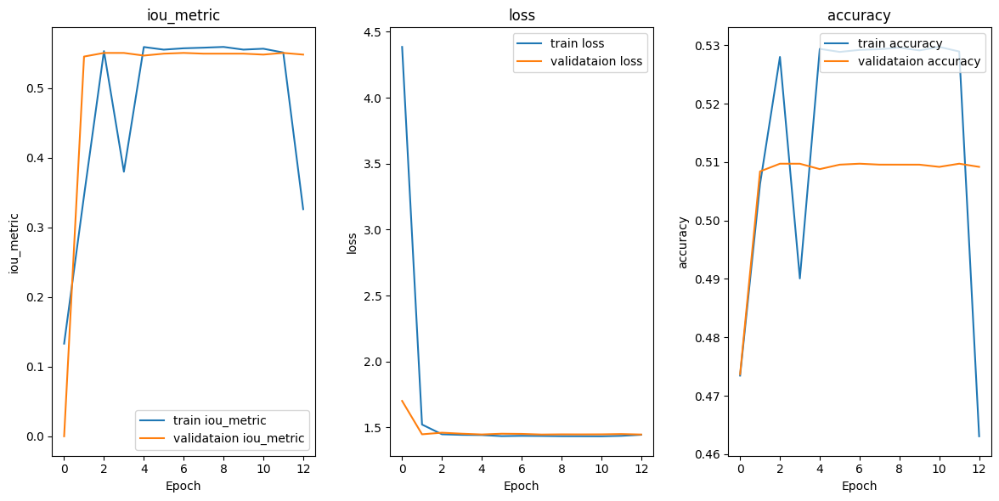

In [38]:
display_learning_curves(segnet_model.history, 'iou_metric', 'loss', 'accuracy')

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 917ms/step


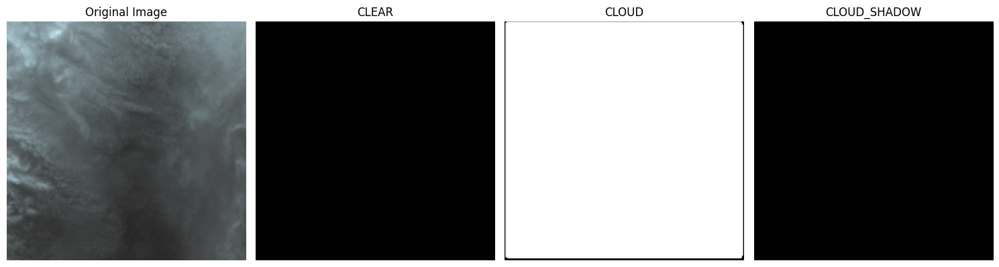

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


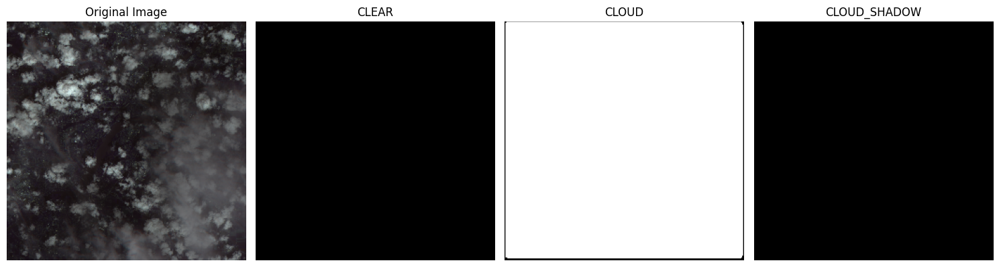

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


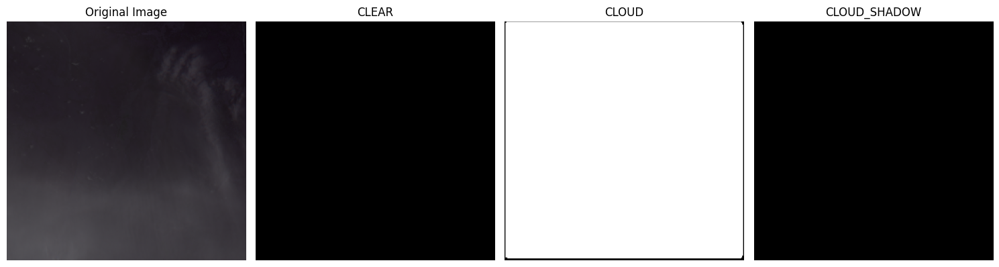

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


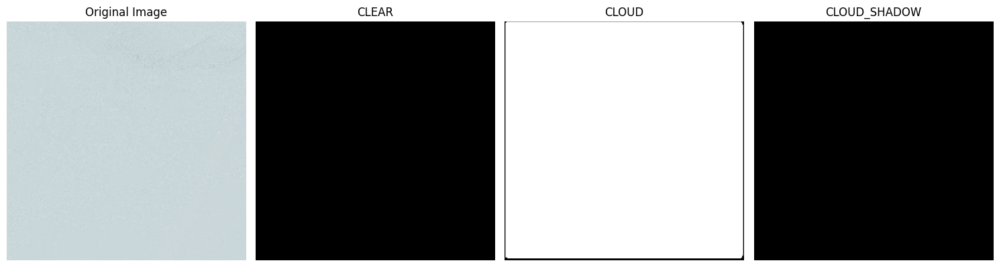

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


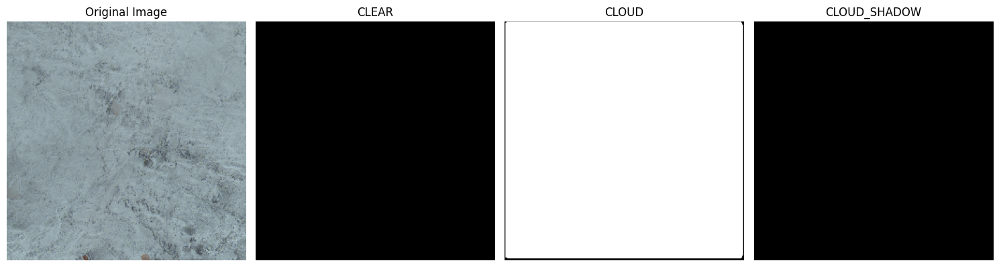

In [46]:
for image_batch, mask_batch in test_batches.take(1):
    image_batch = image_batch.numpy()
    
    for i in range(5):
        randx = np.random.randint(1, 32)
        image = np.expand_dims(image_batch[0][randx], axis=0)
        predictions = segnet_model.predict(image)
        Display(image.squeeze(), predictions.squeeze())